# Project 3

## Data description

- **OBS**: This column represents the observation or time period, which is in the format of year and quarter (1984Q1).

- **Failed_to_Active_banks**: This column shows the ratio of the number of failed banks to the number of active banks.

- **fed**: This column shows the Federal Reserve's discount rate, which is the interest rate at which banks can borrow money from the Federal Reserve.

- **gdp**: This column represents the Gross Domestic Product (GDP), which is the total value of all goods and services produced within a country's borders in a specific time period.

- **sp500_dev**: This column represents the deviation of the S&P 500 index, which is a stock market index that measures the performance of 500 large companies listed on US stock exchanges.

- **ld_gdp**: This column shows the loan-to-deposit ratio, which is the ratio of loans to deposits held by banks.

- **d_fedFunds_rate**: This column represents the change in the Federal Funds rate, which is the interest rate at which banks lend and borrow funds from each other.

- **XMRET**: This column represents the excess market return, which is the difference between the return on the S&P 500 index and the risk-free rate of return.

- **EBP**: This column shows the earnings before provisions, which is the amount of money a company earns before accounting for expenses such as loan loss provisions.

- **TERM_SPREAD**: This column represents the difference between the yields of long-term and short-term Treasury securities.

- **Net Interest Margin for all Commerical Banks**: This column shows the net interest income of all commercial banks as a percentage of their interest-earning assets.

- **Return on Equity**: This column represents the return on equity for all U.S. banks.

- **Loan Loss Reserve to Total Loans for all U.S. Banks; Percent**: This column represents the ratio of loan loss reserves to total loans held by all U.S. banks, expressed as a percentage.

- **Provision for Loan and Lease Losses (Percent Change)**: This column represents the percentage change in the amount of money set aside by banks to cover loan and lease losses.

- **Allowance for Loan and Lease Losses , Percent Change, Quarterly**: This column represents the percentage change in the amount of money set aside by banks to cover potential losses on loans and lease

## Used Modules

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
import itertools
import seaborn as sns
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, roc_curve, auc
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import f_regression
from sklearn.model_selection import permutation_test_score
from sklearn.metrics import r2_score
from tabulate import tabulate


## Data Visualisation Functions

In [41]:
# Functions for data visualization
def print_results(data, title = ''):
    print(title)
    print(tabulate(data, headers = "keys", tablefmt='pretty', floatfmt=".4f", showindex=True))
    print('\n')

def print_results_heatmap(data, title = '', col1 = [], col2 = []):
    print(title)
    styled_data = data.style
    for column in data.columns:
        if data[column].dtype == 'float64':
            vmin = data[column].min()
            vmax = data[column].max()
            if column in col1:
                styled_data = styled_data.background_gradient(subset=column, cmap='RdBu', vmin=vmin, vmax=vmax)
            elif column in col2:
                styled_data = styled_data.background_gradient(subset=column, cmap='coolwarm', vmin=vmin, vmax=vmax)
            else:
                styled_data = styled_data.background_gradient(subset=column, cmap='RdBu', vmin=vmin, vmax=vmax)

    display(styled_data)
    print('\n')
    
def print_data(data, title = ''):
    print(title)
    data = data.dropna()
    result = pd.concat([data.head(5),data.tail(5)], axis=0)
    print(tabulate(result, headers = "keys", tablefmt='pretty', floatfmt=".4f"))
    print('\n')


## Data extraction

### Excel file mapping

In [42]:
# Name Mapping - Corretto, veriricato 04/12

column_map = {
        'obs': 'INDEX',
        'Failed_to_Active_banks': 'F/A_BANKS',
        'fed': 'FED', 
        'gdp': 'GDP', # Real GDP
        'sp500_dev': 'SP500STD', # standard deviation of SP500
        'ld_gdp': 'LDGDP', # Log difference of real GDP
        'd_fedFunds_rate': 'DELTAFED', # the first difference of the Federal funds rate
        'XMRET': 'XMRET', # Stock market excess returns
        'EBP': 'EBP', # Excess bond premium, corporate bond credit spread
        'TERM_SPREAD': 'TERMSPREAD', # treasury term spread
        'Net Interest Margin for all Commerical Banks': 'DELTANIM', # the first differences of bank net interest margin
        'Return on Equity ': 'ROE', # Bank's return on equity
        'Loan Loss Reserve to Total Loans for all U.S. Banks; Percent': 'LLRR', # bank loan loss reserve to total loans ratio; 
        'Provision for Loan and Lease Losses (Percent Change)': 'PLL', # provision for loan losses, 
        'Allowance for Loan and Lease Losses , Percent Change, Quarterly': 'ALL' # allowance for loan losses to total loans ratios
    }

### Read Excel

In [43]:
# Data extraction from designed excel file
def read_excel_file(file_path):
    df = pd.read_excel(file_path, index_col=0)
    df = df.rename(columns=column_map)
    df['F/A_BANKS'] = df['F/A_BANKS'] * 100 #####-------------------------> !
    df.index = pd.PeriodIndex(df.index, freq='Q')
    start_date = pd.to_datetime(df.index[0].start_time).date()
    end_date = pd.to_datetime(df.index[-1].end_time).date()
    df = df.dropna()
    return df, start_date, end_date

## Pre-processing

### Frequency distribution of Failed to Active Banks

In [44]:
def frequency_distribution(data, col_name, num_classes):
    
    # Calculate frequency, relative frequency, and cumulative frequency for each class
    freq = []
    rel_freq = []
    cum_freq = []
    total = len(data)
    index_labels = []
    data[col_name] = data[col_name] * 100

    # calculate mean and standard deviation
    mean = data[col_name].mean()
    std_dev = data[col_name].std()
    
    # calculate histogram with num_classes bars
    n, bins = np.histogram(data[col_name], bins=num_classes)

    # define class limits based on the bin edges of the histogram
    thresholds = [(bins[i], bins[i+1]) for i in range(len(bins)-1)] # Creating thresholds
    midpoints = [(t[0] + t[1])/2 for t in thresholds] # Calculate midpoint for each class

    for i in range(num_classes):
        # This ifs because of the first and last class correct labelling
        if i == 0:
            count = (data[col_name] < thresholds[i][1]).sum()
            index_labels.append(f"{0.0}-{thresholds[i][1]:.4f}")
        elif i == num_classes-1:
            count = (data[col_name] >= thresholds[i][0]).sum()
            index_labels.append(f"{thresholds[i][0]:.4f}-{1.0}")
        else:
            count = ((data[col_name] >= thresholds[i][0]) & (data[col_name] < thresholds[i][1])).sum()
            index_labels.append(f"{thresholds[i][0]:.4f}-{thresholds[i][1]:.4f}")
            
        freq.append(count)
        rel_freq.append(count/total)
        if i == 0:
            cum_freq.append(rel_freq[0])
        else:
            cum_freq.append(cum_freq[i-1] + rel_freq[i])

    # Create a pandas dataframe with the calculated values
    df = pd.DataFrame({
        'Midpoint': midpoints,
        'Frequency': freq,
        'Relative Frequency': rel_freq,
        'Cumulative Frequency': cum_freq
    }, index=index_labels)
    
    return df, mean, std_dev

def prepare_dataset_by_frequency(data, frequency_distribution, dependet_va, predictors):
    
    # Create an empty list to hold the prepared datasets
    prepared_datasets = []

    # Iterate over the frequency data and split the original dataframe by class
    for i, tr in enumerate(frequency_distribution.index.tolist()):
        # Get the lower and upper limits for the class
        lower_limit = float(frequency_distribution.index[i].split('-')[0][1:])
        upper_limit = float(frequency_distribution.index[i].split('-')[1][:-1])
        
        # Create a copy of the original dataframe and add a new column with 1s and 0s
        df = data[predictors].copy()
        df[dependet_va] = data[dependet_va]
        df[dependet_va] = [1 if ((el >= lower_limit) and (el < upper_limit)) else 0 for el in df[dependet_va]]
        prepared_datasets.append((tr,df)) # Add the modified dataframe to the list
        
    return prepared_datasets

### Correlation and Variance inflation index (VIF) of predictors

In [45]:
def combinations(el_list): # Get combination
    all_combo = set()
    for r in range(1, len(el_list) + 1):
        combinations = itertools.combinations(el_list, r)
        for combination in combinations:
            all_combo.add(tuple(sorted(combination)))
    return list(all_combo)

def plot_pair_corr_heatmap(data, predictors): # Plot the pair correlation matrix heatmap
    pair_corr_matrix = data[predictors].corr()
    plt.figure(figsize=(12, 9))
    sns.heatmap(pair_corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
    plt.title("Pair Correlation Matrix")
    plt.show()

# Calculating VIF score for each combination of predictors
def calculate_vif(predictors, data):
    if len(predictors) == 1:
        return np.nan
    X = data[predictors]
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif["VIF"].mean()

def multicollinearity_analysis(data, predictors, target_variable, N = 20, vif_treshold = 5, corr_treshold = 0.40, corr_weight = 1, vif_weight = 1, forced_combo = []):
   
    all_combination = combinations(predictors)
    scores = []
    
    # Calculate the statistics for each combination of predictors
    for combination in all_combination:
        combination = list(combination) # from Tuple to list for reading columns name correctly
        
        if len(combination) > 1:  # for combination with more than 1 variable
            
            # Correlation as average of the correlations between each pair of variable in combination
            predictor = data[combination]
            corr_matrix = predictor.corr()
            correlation = np.mean(corr_matrix.values[np.triu_indices_from(corr_matrix, k=1)])

            # Calculate VIF Score
            vif = round(calculate_vif(combination, predictor),4)
            if (vif <= vif_treshold) or (abs(correlation) <= corr_treshold) or (set(combination) in [set(el) for el in forced_combo]): # Thresholds in input ('vif_treshold', 'corr_treshold') 
                scores.append((len(combination), tuple(combination), correlation, vif, ((abs(correlation) * corr_weight) + (vif * vif_weight))))
        else: 
            # Combination with 1 variable (No VIF and correlation calculated with dependent variable)
            corr_matrix = data[combination + [target_variable]].corr()
            correlation = round(np.mean(np.abs(corr_matrix.values[np.triu_indices_from(corr_matrix, k=1)])),4)
            scores.append((1, tuple(combination), correlation, np.nan, abs(correlation)))
    
    # Preparing output
    df_scores = pd.DataFrame(data=scores, columns=['Len','Combination', 'Correlation', 'VIF','Score'])
    df_scores = df_scores.set_index('Combination')
    df_scores = df_scores.sort_values(by = ['Score'], ascending = True)
    df_single_scores = df_scores.loc[df_scores['Len'] == 1].copy()
    df_scores = df_scores.loc[df_scores['Len'] != 1].copy()
    df_sp_scores = df_scores.loc[[el for el in df_scores.index if set(el) in [set(el1) for el1 in forced_combo]]].copy()
    
    return df_single_scores, df_scores[:N], df_sp_scores

#### Unused

In [46]:
def pair_correlation_analysis(data, predictors, N, corr_threshold = 0.1):
    # Calculate the pair correlation matrix
    corr_pairs = []
    used = set()
    for pr1 in predictors:
        for pr2 in predictors:
            if pr1 != pr2 and (pr1,pr2) not in used:
                used.add((pr1,pr2))
                correlation = data[pr1].corr(data[pr2])
                if correlation >= corr_threshold:
                    pair = ([pr1, pr2], correlation)
                    corr_pairs.append(pair)
    # Put then a plt.show() in order to display the heatmap
    corr_pairs_df = pd.DataFrame(data = corr_pairs, columns = ['Combination','Correlation'])
    corr_pairs_df = corr_pairs_df.set_index('Combination')
    return corr_pairs_df

## Training and Validation

### Data utility functions


In [47]:
def standardize_data(x_train, x_test):
    scaler = StandardScaler()
    x_train_std = scaler.fit_transform(x_train)
    x_test_std = scaler.transform(x_test)
    return x_train_std, x_test_std

def create_lags(data, variables, max_lag):
    output = data.copy()
    for i in range(1, max_lag+1):
        for va in variables:
            output[f'{va}_lag{i}'] = output[va].shift(i)
            output[f'{va}_lag{i}'] = output[f'{va}_lag{i}'].fillna(output[f'{va}_lag{i}'].mean())
    return output

def model_analysis_error(error, model, fails, predictor, threshold, train, test, x_train, x_test, y_train, y_test):
    print(f'--------------------------------------------------------------------------')
    print(f'Error({fails}) for {model}\nPredictor: {predictor} - Threshold: {threshold}')
    print(f'Data info:\nTr. Size: {train.shape}\nVl. Size: {test.shape}')
    print(f'Vals:\nx_train: {x_train.shape} - x_test: {x_test.shape}\nytrain: {y_train.shape} - y_test: {y_test.shape}')
    print(f'Error Message:\n{error}')

### Models

In [48]:
# Probit model

def run_probit(y_train, y_test, x_train, x_test, prds):
    probit_model = sm.Probit(y_train, x_train)
    probit_results = probit_model.fit(disp=False)
    probit_preds = probit_results.predict(x_test)
    
    auroc = roc_auc_score(y_test, probit_preds)
    fpr, tpr, thresholds = roc_curve(y_test, probit_preds)
    
    rsquared = probit_results.prsquared
    pvalue = probit_results.pvalues[prds]
    
    return [auroc, rsquared], fpr, tpr, pvalue


def run_logit(y_train, y_test, x_train, x_test, prds):
    logit_model = sm.Logit(y_train, x_train)
    logit_results = logit_model.fit(disp=False)
    logit_preds = logit_results.predict(x_test)
    
    auroc = roc_auc_score(y_test, logit_preds)
    fpr, tpr, thresholds = roc_curve(y_test, logit_preds)
    
    rsquared = logit_results.prsquared
    pvalue = logit_results.pvalues[prds]
    
    return [auroc, rsquared], fpr, tpr, pvalue


def run_pnn(y_train, y_test, x_train, x_test, prds):
    pnn_model = MLPClassifier(hidden_layer_sizes=(1,), activation='identity', solver='lbfgs', max_iter = 2500)
    pnn_results = pnn_model.fit(x_train, y_train)
    pnn_y_pred = pnn_results.predict_proba(x_test)[:, 1]
    
    auroc = roc_auc_score(y_test, pnn_y_pred)
    fpr, tpr, thresholds = roc_curve(y_test, pnn_y_pred)
    
    rsquared = r2_score(y_test, pnn_y_pred)
    _, pvalues = f_regression(x_train[prds], y_train)
    pvalue = pd.Series(pvalues.tolist())
    
    return [auroc, rsquared], fpr, tpr, pvalue


def run_mlp(y_train, y_test, x_train, x_test, prds):
    mlp_model = MLPClassifier(hidden_layer_sizes=(10,), activation='relu', solver='adam', max_iter = 2500)
    mlp_results = mlp_model.fit(x_train, y_train)
    mlp_y_pred = mlp_results.predict_proba(x_test)[:, 1]
    
    auroc = roc_auc_score(y_test, mlp_y_pred)
    fpr, tpr, thresholds = roc_curve(y_test, mlp_y_pred)
    
    rsquared = r2_score(y_test, mlp_y_pred)
    _, pvalues = f_regression(x_train[prds], y_train)
    pvalue = pd.Series(pvalues.tolist())
    
    return [auroc, rsquared], fpr, tpr, pvalue


def run_random_forest(y_train, y_test, x_train, x_test, prds):
    rf_model = RandomForestClassifier()
    rf_results = rf_model.fit(x_train, y_train)
    rf_preds = rf_results.predict(x_test)
    
    auroc = roc_auc_score(y_test, rf_preds)
    fpr, tpr, thresholds = roc_curve(y_test, rf_preds)
    
    rsquared = 0
    _, pvalues = f_regression(x_train[prds], y_train)
    pvalue = pd.Series(pvalues.tolist())
    
    return [auroc, rsquared], fpr, tpr, pvalue


def run_svm(y_train, y_test, x_train, x_test, prds):
    svm_model = make_pipeline(StandardScaler(), SVC(probability=True))
    svm_results = svm_model.fit(x_train, y_train)
    svm_preds = svm_results.predict(x_test)
    
    auroc = roc_auc_score(y_test, svm_preds)
    fpr, tpr, thresholds = roc_curve(y_test, svm_preds)
    
    rsquared = 0
    _, pvalues = f_regression(x_train[prds], y_train)
    pvalue = pd.Series(pvalues.tolist())
    
    return [auroc, rsquared], fpr, tpr, pvalue


def run_tree_ensemble(y_train, y_test, x_train, x_test, prds):
    tree_ensemble_model = GradientBoostingClassifier()
    tree_ensemble_results = tree_ensemble_model.fit(x_train, y_train)
    tree_ensemble_preds = tree_ensemble_results.predict(x_test)
    
    auroc = roc_auc_score(y_test, tree_ensemble_preds)
    fpr, tpr, thresholds = roc_curve(y_test, tree_ensemble_preds)
    
    rsquared = 0
    _, pvalues = f_regression(x_train[prds], y_train)
    pvalue = pd.Series(pvalues.tolist())
    
    return [auroc, rsquared], fpr, tpr, pvalue

### Models analysis

In [49]:
def run_models(datasets, predictors, dependent_va, lags, fail_tolerance = 2, show_error = True):
    
    output = {}
    models_label = ["Probit","Logit","PNN","MLP","Random Forest","SVM","Tree Ensemble"] # Init scores when threshold/predictor/lag change
    
    for predictor in predictors: # Iterate over all possible combination of predictor
        
        prd = list(predictor)
        
        for i, (threshold, dataset_0) in enumerate(datasets): # For each threshold derived from data frequency distr. there is s specific prepared dataset (DV is binary)
            
            dataset_1 = dataset_0[[dependent_va] + prd] # Select only the columns needed
            dataset_2 = create_lags(dataset_1, prd, lags) # Create lags for every single predictor's variable
            
            for lag in range(1,lags+1): # Iterate over the lags
                
                lags_label = [pr + f'_lag{lag}' for pr in prd]              
                 
                # Last step of dataset preparation
                dataset_3 = dataset_2[[dependent_va] + lags_label] # Final selection over dataset. Selecting only needed columns for current iteration
                
                # From here it's computed ideally only a single instance of a model (but averaged and with the management of fails)
                        
                fails = 0
                success = False # If true all models are computed without errors

                while not success and fails < fail_tolerance: # Due to the train_test_split and the size of the data maybe in last threshold could be problems
                    try:
                        models_score = {}
                        train, test = train_test_split(dataset_3, test_size=0.4, shuffle = True) # Out of sample analysis

                        x_train, x_test = standardize_data(train, test)

                        # Dependent variable
                        y_train = train[dependent_va]
                        y_test = test[dependent_va]

                        # Used Predictor - Indipendent Variables
                        x_train = train[lags_label]
                        x_test = test[lags_label]
                        x_train = sm.add_constant(x_train)
                        x_test = sm.add_constant(x_test)

                        
                        # Fit probit model
                        lb = 'Probit'
                        probit_score = run_probit(y_train, y_test, x_train, x_test, lags_label)
                        models_score[models_label[0]] = probit_score

                        # Fit logit model
                        lb = 'Logit'
                        logit_score = run_logit(y_train, y_test, x_train, x_test, lags_label)
                        models_score[models_label[1]] = logit_score
                        #print(f'LOGIT: {logit_score[:1]}')

                        # PNN model
                        lb = 'PNN'
                        pnn_score = run_pnn(y_train, y_test, x_train, x_test, lags_label)
                        models_score[models_label[2]] = pnn_score

                        # MLP model
                        lb = 'MLP'
                        mlp_score = run_mlp(y_train, y_test, x_train, x_test, lags_label)
                        models_score[models_label[3]] = mlp_score
                        
                        # Random Forest
                        lb = 'Random forest'
                        rf_score = run_random_forest(y_train, y_test, x_train, x_test, lags_label)
                        models_score[models_label[4]] = rf_score

                        # SVM
                        lb = 'SVM'
                        svm_score = run_svm(y_train, y_test, x_train, x_test, lags_label)
                        models_score[models_label[5]] = svm_score

                        # Tree Ensemble
                        lb = 'Tree ensemble'
                        te_score = run_tree_ensemble(y_train, y_test, x_train, x_test, lags_label) 
                        models_score[models_label[6]] = te_score

                        success = True

                    except Exception as e: # Error explanation
                        if show_error:
                            model_analysis_error(e, lb, fails, prd, threshold, train, test, x_train, x_test, y_train, y_test)
                        fails += 1
                        
                # Results for specific predictor-threshold-lag  
                if success:
                    data = {}
                    for i, model in enumerate(models_label):
                        data[model] = (models_score[model][0], models_score[model][1], models_score[model][2], models_score[model][3])

                    # Building final output
                    output.update({tuple([tuple(predictor),threshold,lag]) : data})
    return output


## Post processing

### Data Elaboration

In [50]:
def wald_matrix(data, models, ax):
    n_models = len(models)
    wald_stat_matrix = np.zeros((n_models, n_models))
    for i, model1 in zip(range(n_models), models):
        for j, model2 in zip(range(i + 1, n_models), models):
            var1 = np.trapz(data[model1][1], data[model1][2]) * (1 - np.trapz(data[model1][1], data[model1][2]))
            var2 = np.trapz(data[model2][1], data[model2][2]) * (1 - np.trapz(data[model2][1], data[model2][2]))
            diff = data[model1][0][0] - data[model2][0][0]
            se = np.sqrt(var1 + var2)
            
            wald_stat = diff / se
            wald_stat_matrix[i][j] = wald_stat
            wald_stat_matrix[j][i] = wald_stat

    sns.set()
    ax = sns.heatmap(wald_stat_matrix,annot=True,fmt=".2f",xticklabels=models, yticklabels=models, cmap="coolwarm")
    ax.set_title("Wald-type Test Statistic Heatmap")
    
def get_join_analysis(results, mc):
    df = pd.DataFrame(columns = ['Key', 'Model','Auroc', 'R-Squared', 'Prd.Correlation', 'Prd.VIF'])
    predictors = list(set([k[0] for k in results.keys()]))
    si = 0
    for predictor in predictors:
        keys = list(set([key for key in results.keys() if key[0] == predictor]))
        thresholds = list(set([key[1] for key in keys]))
        lags = list(set([key[2] for key in keys]))
        for threshold in thresholds:
            for lag in lags: 
                key = (predictor, threshold, lag)
                models = list(results[key].keys())
                for model in models:
                    pr_corr = mc.loc[mc.index == predictor]['Correlation'][0]
                    pr_vif = mc.loc[mc.index == predictor]['VIF'][0]
                    row = [key, model] + results[key][model][0] + [pr_corr,pr_vif]
                    df.loc[si] = row
                    si += 1
    return df

### Plots

In [51]:
def plot_models_roc(fpr, tpr, ax, title, label):
    ax.plot(fpr, tpr, label=label)
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title(title)
    ax.legend(loc='lower right')

def plot_results(results):
    predictors = list(set([k[0] for k in results.keys()]))
    for predictor in predictors:
        keys = list(set([key for key in results.keys() if key[0] == predictor]))
        thresholds = list(set([key[1] for key in keys]))
        lags = list(set([key[2] for key in keys]))
        fig, ax = plt.subplots(len(thresholds), len(lags), figsize=(28, 18))
        fig.suptitle(f'\nPREDICTOR - {predictor}\n')
        for i, threshold in enumerate(thresholds):
            for j, lag in enumerate(lags):
                act_key = (predictor, threshold, lag)
                models = list(results[act_key].keys())
                ax[i,j].plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random guess')
                for model in models:
                    title = f'Lag {lag} - Tr. {threshold}'
                    label = f'{model}, AUC={results[act_key][model][0][0].mean():.3f}'
                    plot_models_roc(results[act_key][model][1], results[act_key][model][2], ax[i][j], title, label)
        plt.show()

### Interactive analysis

In [52]:
def predictor_selection(predictors):
    print(f'Available predictors combination:')
    for i, prd in enumerate(predictors):
        print(f'{i} - {prd}')
    n = int(input(f'Select combination: '))
    return predictors[n]

def interactive_analysis(results, mc):
    flag = 1
    predictors = list(set([k[0] for k in results.keys()]))
    while(flag == 1):
        # Select predictor to analyze
        chosen_prd = predictor_selection(predictors)
        
        si = 0
        keys = list(set([key for key in results.keys() if key[0] == chosen_prd]))
        thresholds = list(set([key[1] for key in keys]))
        lags = list(set([key[2] for key in keys]))
        pr_corr = mc.loc[mc.index == chosen_prd]['Correlation'][0]
        pr_vif = mc.loc[mc.index == chosen_prd]['VIF'][0]
        print(f'\nChosen Predictor -> {chosen_prd}\n Correlation score -> {pr_corr}\n VIF Score -> {pr_vif}\n')
        for threshold in thresholds:

            for lag in lags: 
                print(f'\n\n-------------------------------------- Threshold {threshold} - Lag {lag} --------------------------------------')
                
                act_key = (chosen_prd, threshold, lag)
                key = (threshold, lag)
                models = list(results[act_key].keys())

                columns = ['Threshold', 'Lag', 'Model','Auroc', 'R-Squared'] + [el + '_pvalue' for el in results[act_key][models[0]][3].index.tolist()] 
                df = pd.DataFrame(columns = columns)
                fig, ax = plt.subplots(1, 2, figsize=(20, 10))
                ax[0].plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random guess')

                
                for model in models:
                    title = f'Lag {lag}'
                    label = f'{model}, AUC={results[act_key][model][0][0].mean():.3f}'
                    plot_models_roc(results[act_key][model][1], results[act_key][model][2], ax[0], title, label)
                    row = [threshold, lag, model] + results[act_key][model][0] + list(results[act_key][model][3].values)
                    df.loc[si] = row
                    si += 1
                    
                mtrx = wald_matrix(results[act_key], models, ax[1])
                for col in df.columns:
                    if df[col].dtype == 'float64':
                        max_val = df[col].max()
                        df[col + '_Gains'] = df[col].apply(lambda x: '{:.6f}'.format(x-max_val) if x != max_val else '.')
                print_results_heatmap(df, 'Auroc Score',list(df.columns)[:5], list(df.columns)[5:])

                plt.show()

        flag = int(input(f'Press 1 for another analysis, 0 to exit.'))  

## Main

### Parameters and Data

In [53]:
# Data file sourc epath
file_path = 'project3_data.xlsx' 

# Predictors
predictors = [
    'XMRET',
    'EBP',
    'TERMSPREAD',
    'DELTAFED',
    'ROE',
    'LLRR',
    'DELTANIM',
    'PLL',
    'ALL',
    'LDGDP']

dependent_variable = 'F/A_BANKS'
requested_combo = [('TERMSPREAD','LLRR','ROE')] # Format [('', ... , ''), ..., ('', ... ,'')] 
requested_combo = [sorted(el) for el in requested_combo]

data, start_date, end_date = read_excel_file(file_path)

print_data(data, f'Input Dataset\n\n --> Start date: {start_date}\n --> End date: {end_date}\n')

Input Dataset

 --> Start date: 1984-01-01
 --> End date: 2020-12-31

+--------+---------------------+-------+-----------+-------------+--------------+----------+----------+--------------+-------------+----------+-------+------+--------+------+
|  obs   |      F/A_BANKS      |  FED  |    GDP    |  SP500STD   |    LDGDP     | DELTAFED |  XMRET   |     EBP      | TERMSPREAD  | DELTANIM |  ROE  | LLRR |  PLL   | ALL  |
+--------+---------------------+-------+-----------+-------------+--------------+----------+----------+--------------+-------------+----------+-------+------+--------+------+
| 1984Q2 | 0.13796909999999998 | 11.06 | 7617.547  | 3.060281977 | 0.017130361  |   1.15   | -3.85652 | -0.137981731 | 3.335238095 |   3.87   | 10.57 | 1.18 |  -5.6  | 3.1  |
| 1984Q3 |      0.1310706      | 11.3  | 7690.985  | 3.070506517 | 0.009594462  |   0.24   | 2.78496  | -0.027157524 | 2.522857143 |   3.91   | 11.11 | 1.2  |  45.2  | 7.4  |
| 1984Q4 | 0.13796909999999998 | 8.38  | 7754.117  | 3.

### Frequency distribution

In [54]:
# Quantiles for frequency distribution
quantiles = 3

# Computing systematic failure frequency distribution
frequency_dist, mean, std_dev = frequency_distribution(data, dependent_variable, quantiles)
print_results(frequency_dist, f'\nSystematic failure frequency distribution ({dependent_variable})\n\nChosen Quantiles --> {quantiles}\n\nMean --> {mean}\nStandard Deviation --> {std_dev}\n')

# prepare dataset removes all not necessary variables also, such FED, GDP (Log used) and SP500 STD
prepared_data = prepare_dataset_by_frequency(data, frequency_dist, dependent_variable, predictors)
print(f'--> Datasets prepared.')


Systematic failure frequency distribution (F/A_BANKS)

Chosen Quantiles --> 3

Mean --> 12.445672653061225
Standard Deviation --> 14.96295072830503

+-----------------+--------------------+-----------+---------------------+----------------------+
|                 |      Midpoint      | Frequency | Relative Frequency  | Cumulative Frequency |
+-----------------+--------------------+-----------+---------------------+----------------------+
|   0.0-17.3851   | 8.692540000000001  |   103.0   | 0.7006802721088435  |  0.7006802721088435  |
| 17.3851-34.7702 | 26.077620000000003 |   28.0    | 0.19047619047619047 |  0.891156462585034   |
|   34.7702-1.0   | 43.462700000000005 |   16.0    | 0.10884353741496598 |         1.0          |
+-----------------+--------------------+-----------+---------------------+----------------------+


--> Datasets prepared.


### Independent variables analysis

**Variance inflation factor - VIF**

Variance inflation factor measures how much the behavior (variance) of an independent variable is influenced, or inflated, by its interaction/correlation with the other independent variables. 


- VIF equal to 1 = variables are not correlated
- VIF between 1 and 5 = variables are moderately correlated 
- VIF greater than 5 = variables are highly correlated2

The higher the VIF, the higher the possibility that multicollinearity exists, and further research is required. When VIF is higher than 10, there is significant multicollinearity that needs to be corrected


Single predictor correlation with F/A_BANKS
+-------------+----------+------------+---------------+----------+------------+---------------+----------+-----------------+----------+-----------+
|             | ('ALL',) | ('LDGDP',) | ('DELTAFED',) | ('PLL',) | ('XMRET',) | ('DELTANIM',) | ('EBP',) | ('TERMSPREAD',) | ('ROE',) | ('LLRR',) |
+-------------+----------+------------+---------------+----------+------------+---------------+----------+-----------------+----------+-----------+
| Correlation |  0.0044  |   0.0187   |     0.022     |  0.0364  |   0.0531   |    0.1986     |  0.2214  |     0.3625      |  0.5128  |  0.7504   |
+-------------+----------+------------+---------------+----------+------------+---------------+----------+-----------------+----------+-----------+


Top 20 Predictor Combination Ranking for Score(= Correlation * Correlation_weight) + (VIF * VIF_weight)
+--------------------------------------------+-----+------------------------+--------+--------------------+
|

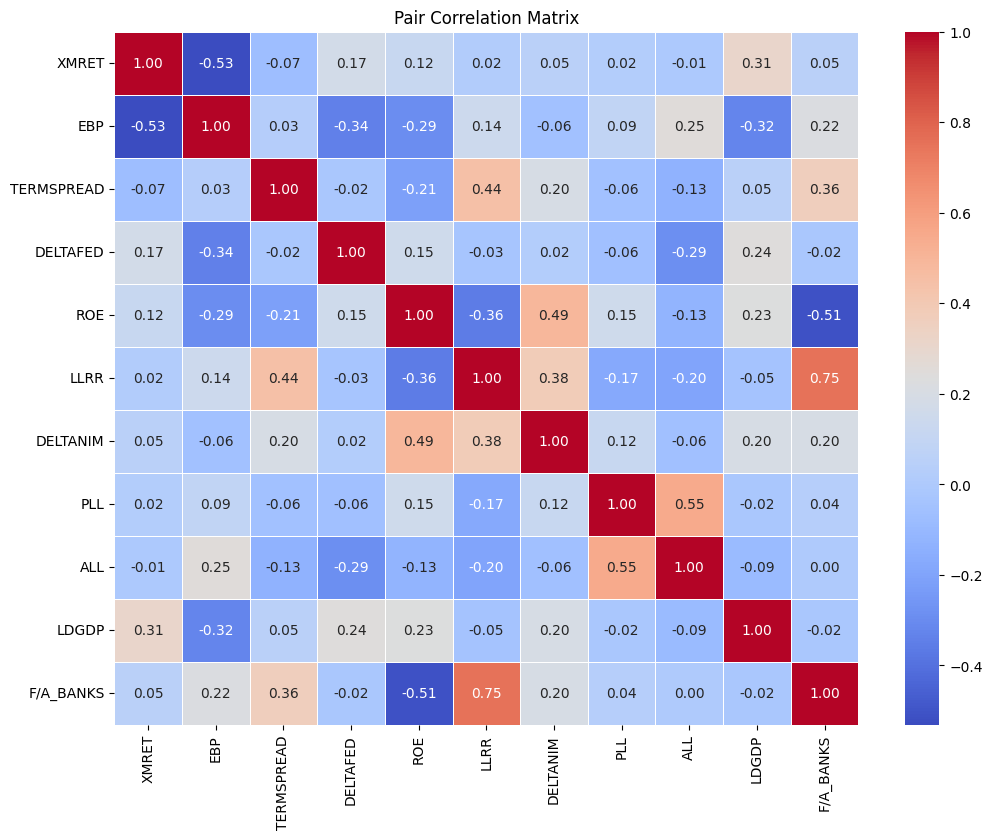

In [57]:
# Independent variables analysis - Correlation and VIF (+ Single predictor correlation with target variable)
correlation_threshold = 0.2 # For pair correlation
vif_threshold = 2
correlation_weight = 1
vif_weight = 1

# Top-N requested combination of dependent variables
N = 20
# Top-N ranking of (1,...,N)-combinations average correlations between predictors. Using Correlation and VIF score.
# Special scores are score of manually added dependent variable combination
single_score, combination_topn, requested_scores = multicollinearity_analysis(data, predictors, dependent_variable, N, vif_threshold, correlation_threshold, correlation_weight, vif_weight, requested_combo) 

print_results(single_score.T[1:2], f'\nSingle predictor correlation with {dependent_variable}')
print_results(combination_topn, f'Top {str(N)} Predictor Combination Ranking for Score(= Correlation * Correlation_weight) + (VIF * VIF_weight)')
print_results(requested_scores, f'Requested Scores')

mc_analysis = pd.concat([single_score, combination_topn, requested_scores], axis = 0)
plot_pair_corr_heatmap(data, predictors + [dependent_variable])

chose_combo =  combination_topn.index.tolist() + requested_combo # single_score.index.tolist() +# Try all single variable and top N combinations

### Run Models

In [ ]:
# Models
model_iteration = 5
fail_tolerance = 3 # Numbers of attempts to recompute a model if an error arise
lags = 4

# Suffix to add at the target variable when preparing dataset in split_dataframe_by_frequency
suffix_pr_dataset = '_Binary' 

results = run_models(prepared_data, chose_combo, dependent_variable, lags, show_error = False)#, model_iteration, results_round_factor, fail_tolerance, False) # Execution 2 min +-
print('Analysis completed')

## Show results

#### Full data joined

In [ ]:
o = get_join_analysis(results, mc_analysis)
print_results_heatmap(o.sort_values(by = ['Auroc','R-Squared'], ascending = False).reset_index(drop = True),'Leaderboard heatmap', o[['Auroc','R-Squared']], o[['Prd.Correlation','Prd.VIF']])

Leaderboard heatmap


,Key,Model,Auroc,R-Squared,Prd.Correlation,Prd.VIF
0,"(('LLRR', 'ROE', 'TERMSPREAD'), '17.3851-34.7702', 3)",Random Forest,0.939799,0.000000,-0.042817,5.314700
1,"(('DELTAFED', 'LLRR'), '0.0-17.3851', 1)",MLP,0.911337,0.474937,-0.033584,1.016400
2,"(('LLRR', 'ROE', 'TERMSPREAD'), '17.3851-34.7702', 3)",Tree Ensemble,0.901338,0.000000,-0.042817,5.314700
3,"(('EBP', 'PLL', 'ROE'), '0.0-17.3851', 4)",Random Forest,0.899242,0.000000,-0.019053,1.010900
4,"(('DELTANIM', 'EBP'), '0.0-17.3851', 3)",SVM,0.898485,0.000000,-0.057708,1.016500
5,"(('LLRR', 'ROE', 'TERMSPREAD'), '17.3851-34.7702', 4)",SVM,0.894737,0.000000,-0.042817,5.314700
6,"(('LLRR', 'ROE', 'TERMSPREAD'), '0.0-17.3851', 1)",MLP,0.892977,0.322163,-0.042817,5.314700
7,"(('DELTAFED', 'LLRR'), '0.0-17.3851', 1)",PNN,0.880814,0.423667,-0.033584,1.016400
8,"(('DELTAFED', 'LLRR'), '0.0-17.3851', 1)",Logit,0.880814,0.312040,-0.033584,1.016400
9,"(('EBP', 'PLL', 'ROE'), '0.0-17.3851', 4)",MLP,0.880303,0.304660,-0.019053,1.010900


#### All Plots

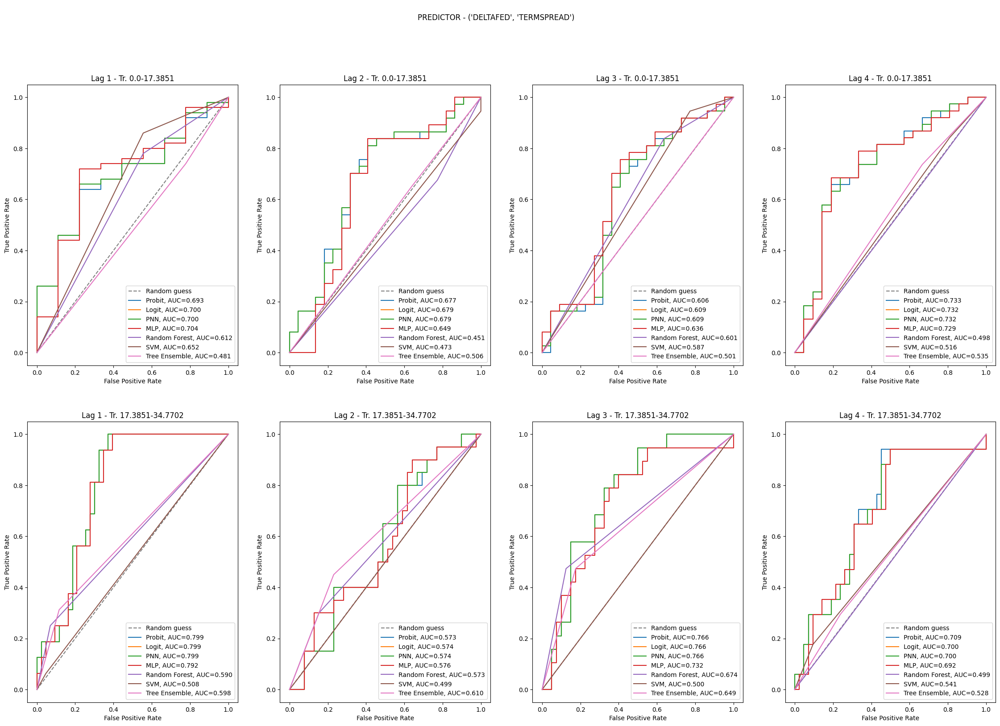

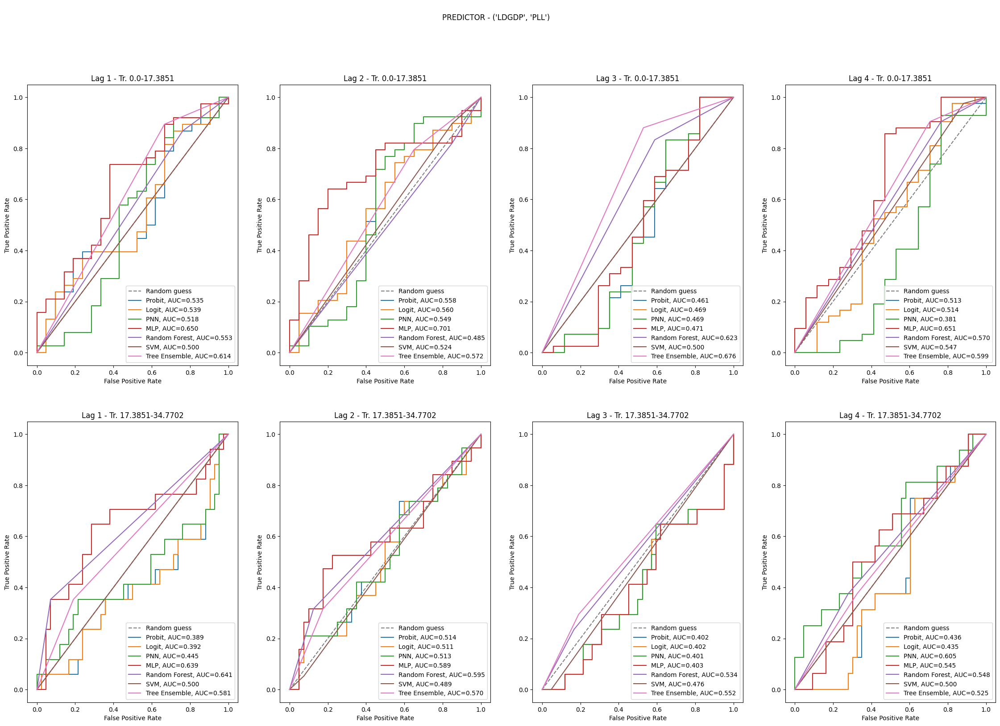

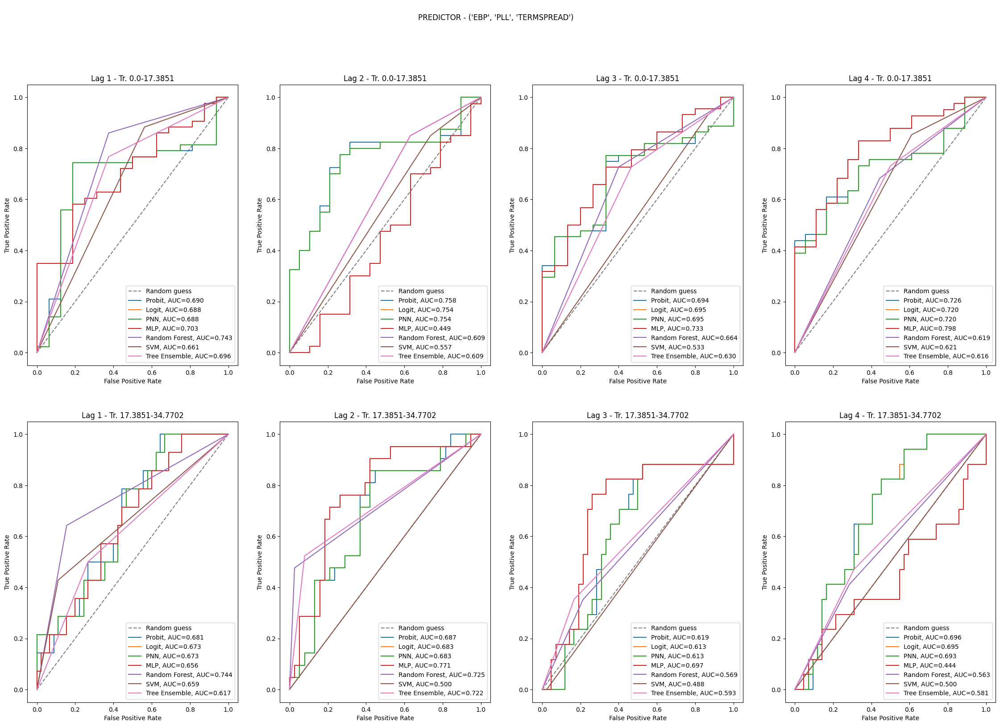

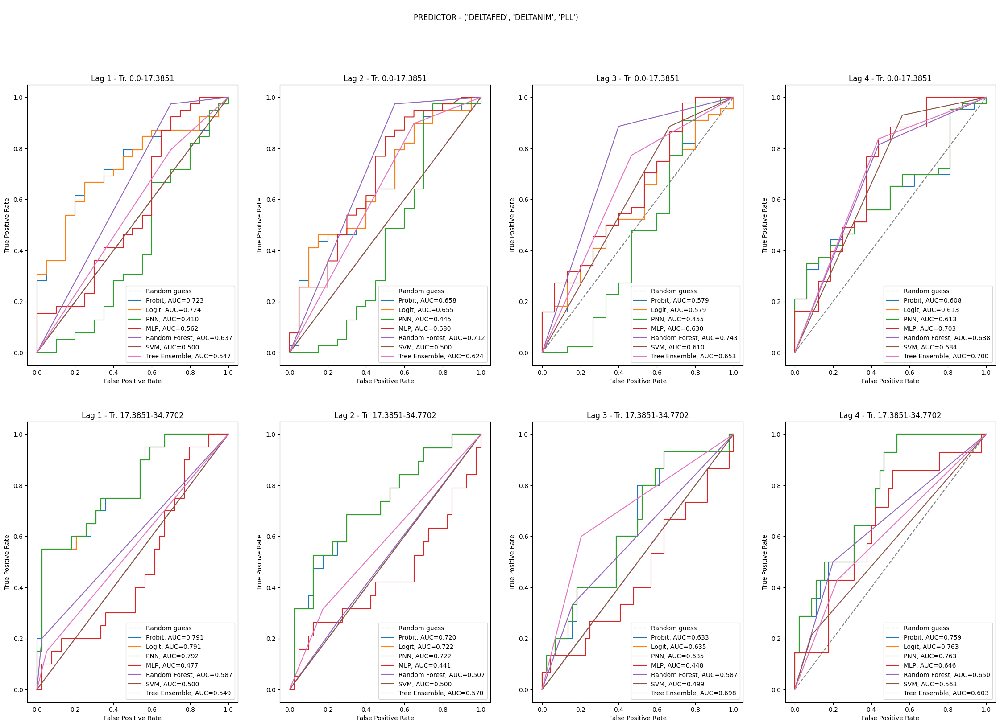

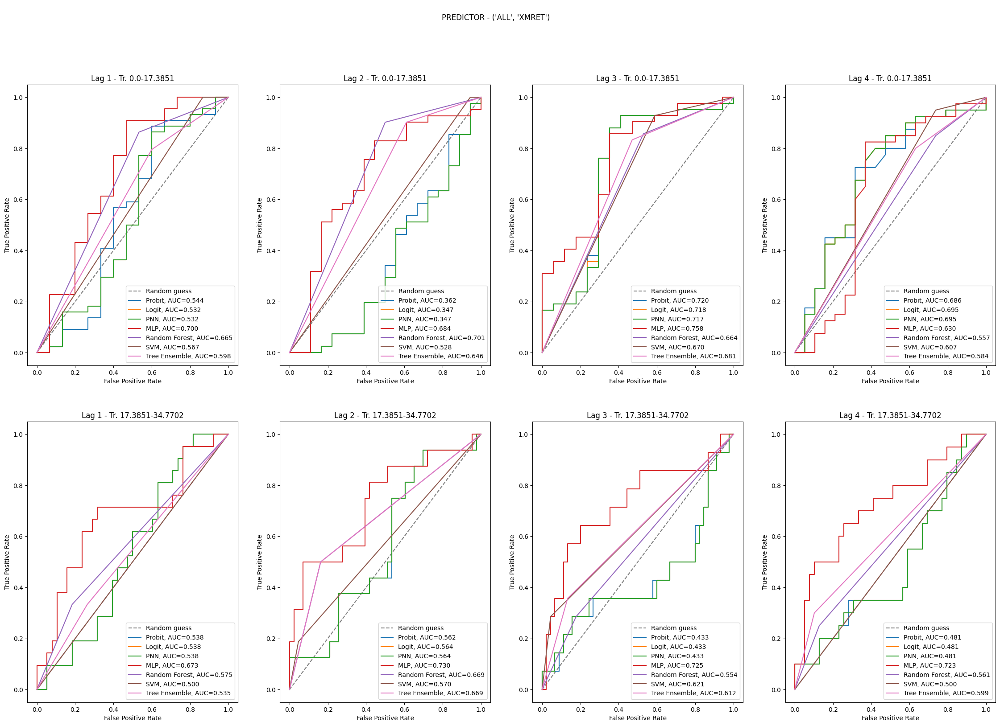

...

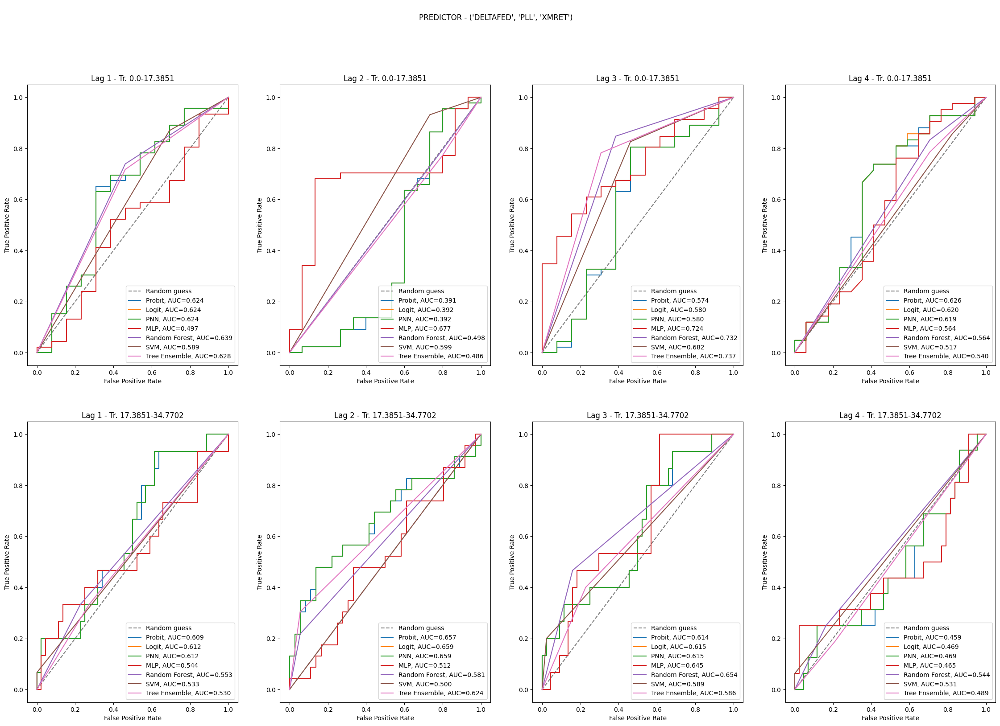

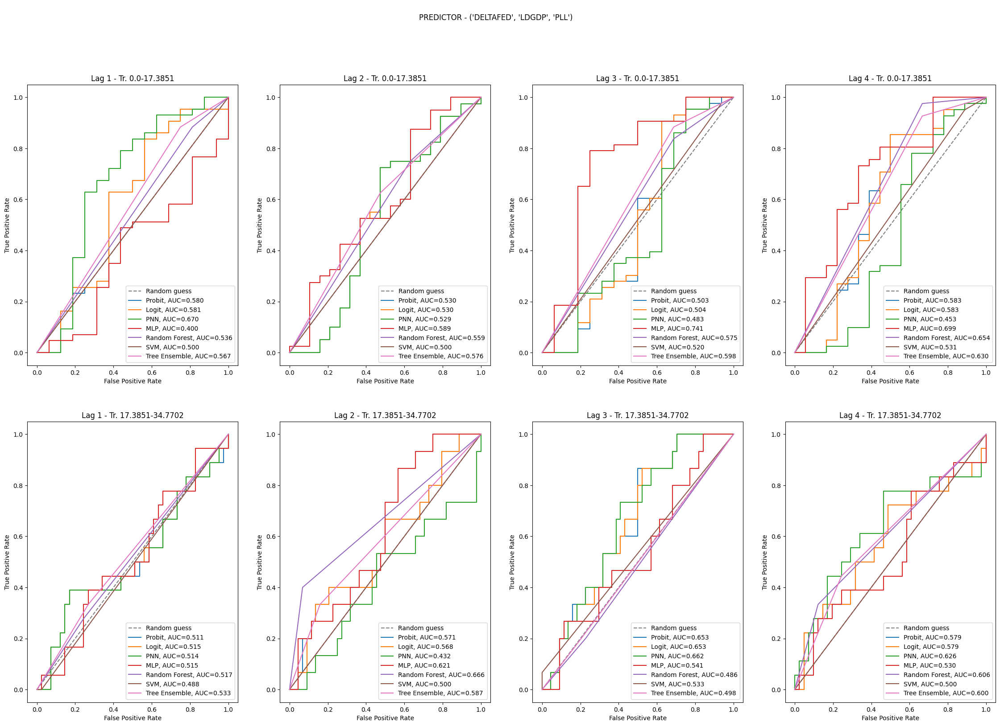

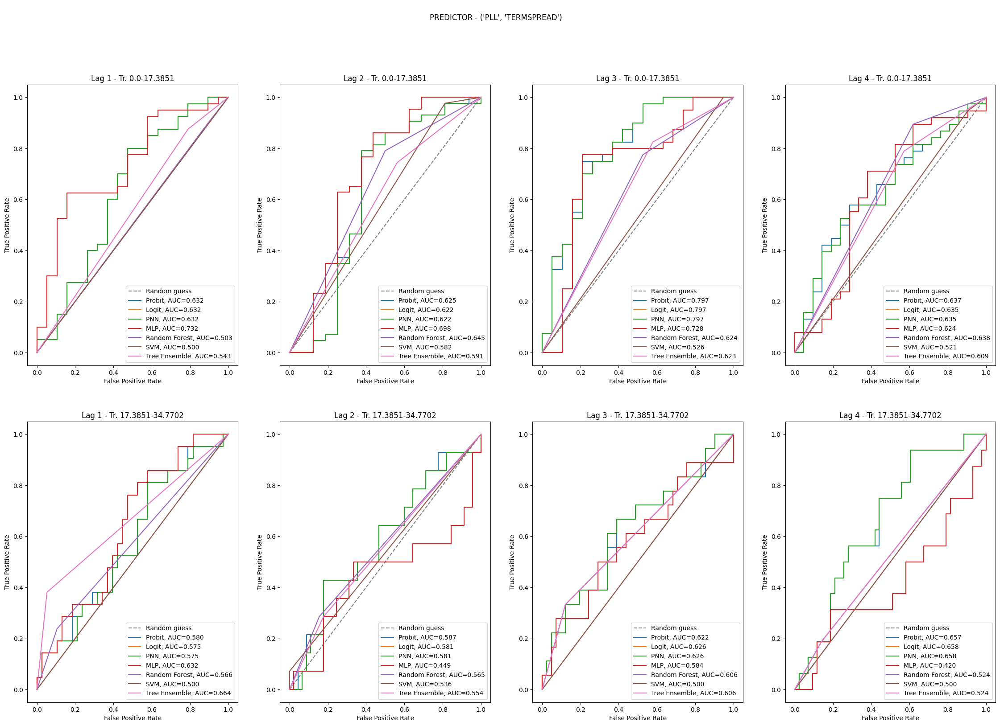

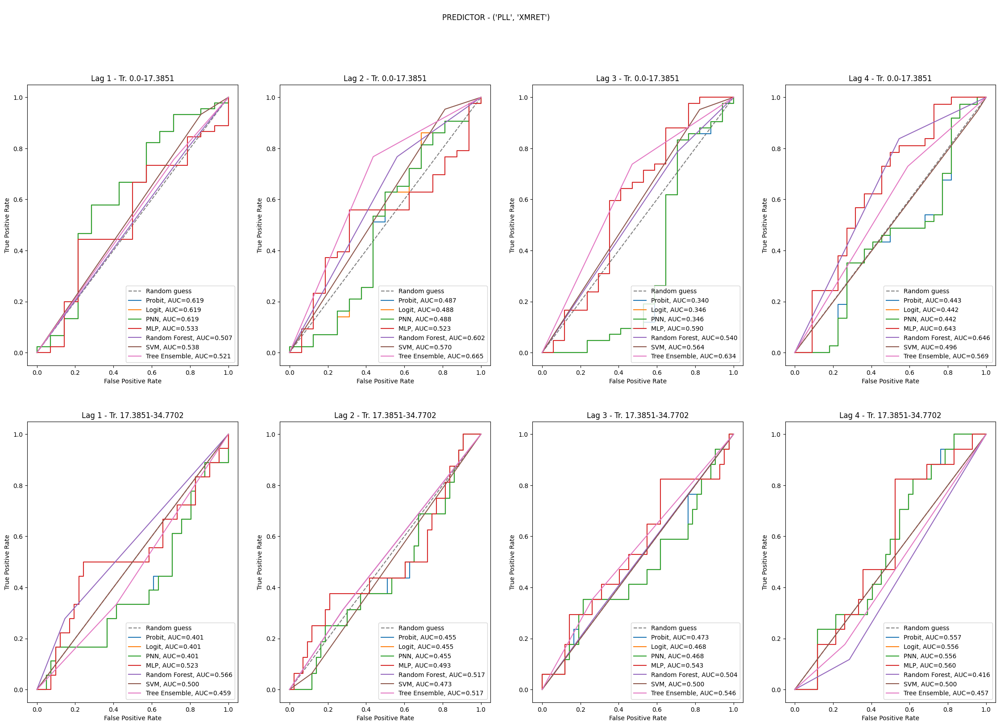

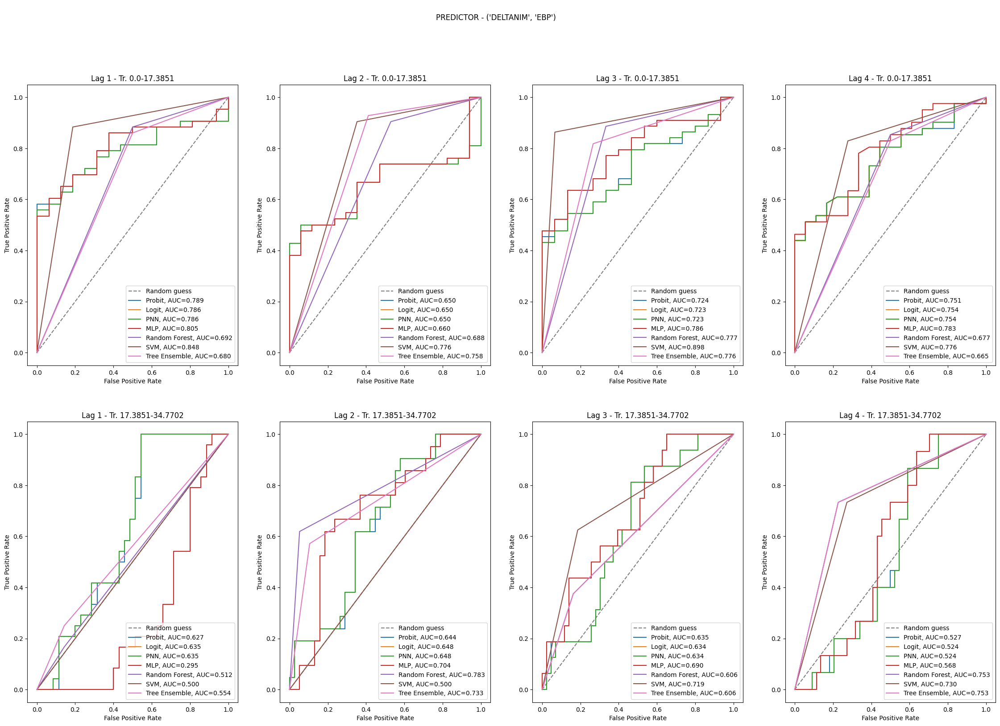

In [ ]:
plot_results(results)

#### Interactive predictor selection

In [ ]:
interactive_analysis(results, mc_analysis)

Available predictors combination:
0 - ('DELTAFED', 'TERMSPREAD')
1 - ('LDGDP', 'PLL')
2 - ('EBP', 'PLL', 'TERMSPREAD')
3 - ('DELTAFED', 'DELTANIM', 'PLL')
4 - ('ALL', 'XMRET')
5 - ('EBP', 'PLL', 'ROE')
6 - ('DELTAFED', 'LLRR')
7 - ('PLL', 'TERMSPREAD', 'XMRET')
8 - ('DELTAFED', 'PLL')
9 - ('EBP', 'LLRR', 'PLL')
10 - ('DELTAFED', 'DELTANIM')
11 - ('LLRR', 'ROE', 'TERMSPREAD')
12 - ('EBP', 'TERMSPREAD')
13 - ('DELTAFED', 'PLL', 'TERMSPREAD', 'XMRET')
14 - ('DELTANIM', 'EBP', 'PLL')
15 - ('DELTAFED', 'PLL', 'TERMSPREAD')
16 - ('DELTAFED', 'PLL', 'XMRET')
17 - ('DELTAFED', 'LDGDP', 'PLL')
18 - ('PLL', 'TERMSPREAD')
19 - ('PLL', 'XMRET')
20 - ('DELTANIM', 'EBP')


In [ ]:
# Code cleaning
# Standardize functions description
# ROUND NUMBERS ----------------!!